In [15]:
import sys
import numpy as np
import os
sys.path.insert(0, os.path.abspath('/notebooks/pytorch_timeseries'))
import  matplotlib.pyplot as plt
from matplotlib.pyplot import figure


In [2]:
from torch_timeseries.datasets import Electricity
electricity = Electricity(root='./data', window=60, horizon=1)
df = electricity.raw_df()


Using downloaded and verified file: ./data/electricity/raw/electricity.txt.gz
Extracting ./data/electricity/raw/electricity.txt.gz to ./data/electricity/raw


In [71]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(electricity.raw_tensor)
t = scaler.transform(electricity.raw_tensor)



In [91]:
torch.ones(100).shape

torch.Size([100])

In [89]:
batch_data = np.expand_dims(t, 0)
scaler.transform(batch_data)

ValueError: Found array with dim 3. StandardScaler expected <= 2.

In [98]:
a = torch.tensor([[ 0.5, -1. ,  99. ],
       [ 1. ,  0. ,  0. ],
       [ 100. ,  1. , -0.5]])

In [106]:
a.abs()

tensor([[  0.5000,   1.0000,  99.0000],
        [  1.0000,   0.0000,   0.0000],
        [100.0000,   1.0000,   0.5000]])

In [101]:
scale = a.max(axis=0).values

In [105]:
a/scale

tensor([[ 0.0050, -1.0000,  1.0000],
        [ 0.0100,  0.0000,  0.0000],
        [ 1.0000,  1.0000, -0.0051]])

In [103]:
scale

tensor([100.,   1.,  99.])

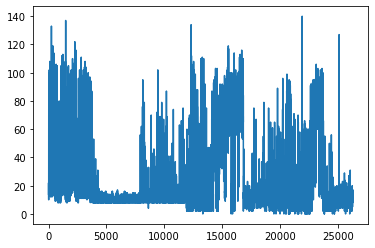

In [100]:
plt.plot(df[0])

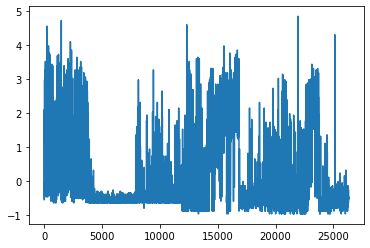

In [ ]:
plt.plot(t[:,0])

In [3]:
# electricity.raw_tensor.shape
# electricity[0:32]

ValueError: only one element tensors can be converted to Python scalars

In [3]:
from  experiments.net import Net

n = Net(input_node=321, in_dim=1, embed_dim=16)

In [61]:
# x = electricity[0:31][0].unsqueeze(1)
# x = electricity.raw_tensor[0:31]
# x.shape torch.Size([10, 1, 321])
# n(x).shape
# len(df.columns)
torch.rand(1,3)

tensor([[0.6086, 0.6091, 0.1793]])

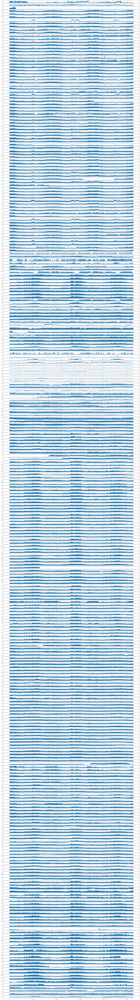

In [60]:
# plt.plot(df[0],figsize=(8, 6))
def set_size(w,h, ax=None):
    """ w, h: width, height in inches """
    if not ax: ax=plt.gca()
    l = ax.figure.subplotpars.left
    r = ax.figure.subplotpars.right
    t = ax.figure.subplotpars.top
    b = ax.figure.subplotpars.bottom
    figw = float(w)/(r-l)
    figh = float(h)/(t-b)
    ax.figure.set_size_inches(figw, figh)



# fig = figure(figsize=(70, 1), dpi=80)
fig = figure(figsize=(40, 300))  # 40*dpi 宽 ， 300*dpi 高， 一般一行一个 ,300个节点300即可
axes = fig.subplots(len(df.columns), 1)

for i in range(len(axes)):
    axes[i].plot(df[i])
    # set_size(80,8, axes[i])

In [36]:
axes[i]

<AxesSubplot:>

In [38]:
plt.show()

In [13]:
import torch
from torch.utils.data.dataset import random_split

dataset_size = len(electricity)
seed_generator = torch.Generator()
seed_generator.manual_seed(42)
train_size = int(0.6 * len(electricity))
test_size = int(0.2 * len(electricity))
val_size = len(electricity) - test_size - train_size
train_dataset, test_dataset, val_dataset = torch.utils.data.random_split(electricity, [train_size, test_size,val_size], generator=seed_generator)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=64)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=64)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=64)





In [7]:
plt

NameError: name 'plt' is not defined

In [5]:
loader = torch.utils.data.DataLoader(test_dataset, batch_size=64)
# for x, y in loader:
for x, y in loader:
    x = torch.tensor(x, dtype=torch.float32)
    x = x.unsqueeze(1)
    x = x.transpose(2,3 ) # ( )
    print(x.shape)
    print(n(x).shape)
    break


torch.Size([64, 1, 321, 60])
torch.Size([64, 16, 321, 48])


/root/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  after removing the cwd from sys.path.


In [58]:
import torch.nn as nn
c2d = nn.Conv2d(2,2, (1,2))

In [65]:
m = torch.randint(3, 5, (64,2,5,2))
m=torch.tensor(m, dtype=torch.float32) 


/root/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  


In [67]:
c2d(m).shape

torch.Size([64, 2, 5, 1])

In [57]:
# c2 = nn.Conv2d(2,2, (1,2))
c2 = nn.Conv2d(1,1, (1,2))
params = []
for param in c2.parameters():
    print(param.shape)
    # params.append(param.view(-1))
# params = torch.cat(params)


torch.Size([1, 1, 1, 2])
torch.Size([1])


In [50]:
params

tensor([ 0.1247,  0.3416, -0.4713, -0.0111, -0.1964,  0.2717, -0.4520, -0.2634,
        -0.4559, -0.3036], grad_fn=<CatBackward0>)

In [14]:
# electricity[10]
# # for x, y in train_loader:
# #     print(x[0][0])
# #     break
# # # for index in torch.utils.data.SequentialSampler(val_dataset):
# # #     print("index: {}".format(str(index)))


(tensor([[  64.,  113.,   13.,  ..., 1270.,  211., 2600.],
         [  53.,  142.,   11.,  ..., 1440.,  211., 2637.],
         [  26.,  158.,   11.,  ..., 1879.,  196., 2665.],
         ...,
         [  33.,  108.,   15.,  ..., 1643.,  186., 2854.],
         [  74.,  107.,   17.,  ..., 1629.,  182., 2946.],
         [  22.,  107.,   25.,  ..., 1956.,  182., 3003.]], dtype=torch.float64),
 tensor([1.9000e+01, 1.1300e+02, 2.0000e+01, 7.8800e+02, 3.3200e+02, 1.2730e+03,
         2.4000e+01, 1.5140e+03, 3.4700e+02, 3.7000e+02, 2.5700e+02, 1.8500e+02,
         1.7600e+02, 2.2500e+02, 3.1100e+02, 1.5730e+03, 6.6000e+01, 2.6300e+02,
         9.0200e+02, 1.4400e+02, 6.2000e+01, 1.4830e+03, 1.5900e+02, 1.4700e+02,
         4.6900e+02, 2.8400e+02, 5.6300e+02, 9.8000e+01, 7.1500e+02, 5.4000e+01,
         6.6900e+02, 4.9600e+02, 8.7300e+02, 2.8500e+02, 6.4340e+03, 2.2000e+02,
         3.3600e+02, 1.1640e+03, 2.0500e+02, 9.5000e+01, 5.8180e+03, 9.0200e+02,
         3.3200e+02, 2.4000e+02, 5.4000e+0

In [18]:
electricity.raw_tensor[10:20]

tensor([[  64.,  113.,   13.,  ..., 1270.,  211., 2600.],
        [  53.,  142.,   11.,  ..., 1440.,  211., 2637.],
        [  26.,  158.,   11.,  ..., 1879.,  196., 2665.],
        ...,
        [  33.,  108.,   15.,  ..., 1643.,  186., 2854.],
        [  74.,  107.,   17.,  ..., 1629.,  182., 2946.],
        [  22.,  107.,   25.,  ..., 1956.,  182., 3003.]], dtype=torch.float64)

In [38]:
test_size

10517

In [7]:
dfcorr = df.corr()

In [8]:
dfcorr

,0,1,2,3,4,5,6,7,8,9,...,311,312,313,314,315,316,317,318,319,320
0,1.000000,0.120356,0.088949,-0.031501,-0.040396,-0.016572,0.011624,0.029377,0.100929,-0.090342,...,0.048303,0.067681,0.038212,0.023597,0.005247,0.041009,0.099488,0.008804,0.040805,0.073574
1,0.120356,1.000000,-0.058929,0.189954,0.000257,0.262326,0.302688,0.387392,0.142719,0.070334,...,0.393459,0.456136,0.434959,0.380335,0.479104,0.357594,0.098393,0.001747,0.109961,0.286895
2,0.088949,-0.058929,1.000000,0.046756,0.137940,0.066100,-0.056507,-0.031601,0.076420,0.015201,...,-0.049542,-0.064363,-0.089645,-0.056287,-0.102240,-0.045463,0.092347,-0.007767,-0.006690,-0.047713
3,-0.031501,0.189954,0.046756,1.000000,0.771150,0.823820,0.122784,0.684084,0.479536,0.343102,...,0.386365,0.249668,0.170144,0.250688,0.209529,0.222247,0.222780,0.019402,0.278744,-0.027218
4,-0.040396,0.000257,0.137940,0.771150,1.000000,0.727827,0.178330,0.532921,0.516180,0.405233,...,0.188148,0.058820,-0.016915,0.091385,-0.005746,0.056998,0.233288,-0.028107,0.339529,-0.055534
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
316,0.041009,0.357594,-0.045463,0.222247,0.056998,0.386725,0.114255,0.581952,0.217467,0.294129,...,0.829874,0.840106,0.810121,0.873341,0.797017,1.000000,0.196127,0.293030,0.251929,0.544756
317,0.099488,0.098393,0.092347,0.222780,0.233288,0.180418,0.154320,0.240619,0.158200,0.145619,...,0.280957,0.158254,0.238574,0.222926,0.165284,0.196127,1.000000,0.310783,0.471822,0.352932
318,0.008804,0.001747,-0.007767,0.019402,-0.028107,0.005079,0.188796,0.164214,0.005786,0.113055,...,0.326817,0.178830,0.351843,0.283372,0.251121,0.293030,0.310783,1.000000,0.360733,0.515986
319,0.040805,0.109961,-0.006690,0.278744,0.339529,0.382092,0.071365,0.421697,0.387264,0.385005,...,0.303085,0.242055,0.233467,0.255405,0.252746,0.251929,0.471822,0.360733,1.000000,0.500509


In [18]:
dfcorr.transform(np.sort)

,0,1,2,3,4,5,6,7,8,9,...,311,312,313,314,315,316,317,318,319,320
0,-0.107460,-0.245897,-0.201392,-0.296356,-0.319470,-0.333804,-0.201701,-0.431845,-0.359550,-0.367743,...,-0.342438,-0.372808,-0.316960,-0.335875,-0.393174,-0.359206,-0.201527,-0.234839,-0.574589,-0.508356
1,-0.104628,-0.228652,-0.186807,-0.238908,-0.317916,-0.301854,-0.121035,-0.399264,-0.299359,-0.312677,...,-0.339048,-0.368752,-0.301624,-0.332023,-0.369127,-0.350145,-0.186177,-0.188137,-0.501176,-0.461668
2,-0.091697,-0.203338,-0.186711,-0.194016,-0.308354,-0.243069,-0.117887,-0.315716,-0.287395,-0.297802,...,-0.263687,-0.316366,-0.253587,-0.252291,-0.273795,-0.272953,-0.154831,-0.185842,-0.487160,-0.376700
3,-0.090342,-0.189837,-0.186365,-0.188687,-0.284429,-0.225282,-0.111700,-0.269926,-0.211636,-0.217388,...,-0.237866,-0.244117,-0.207859,-0.224353,-0.260419,-0.243745,-0.105987,-0.184905,-0.389518,-0.355740
4,-0.084135,-0.140990,-0.177827,-0.181193,-0.261154,-0.224977,-0.105459,-0.114151,-0.186231,-0.207063,...,-0.049874,-0.243191,-0.163834,-0.155435,-0.198250,-0.124469,-0.019254,-0.132905,-0.083728,-0.103068
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
316,0.138096,0.594816,0.165836,0.877682,0.806268,0.897887,0.459527,0.844937,0.648554,0.529171,...,0.919199,0.913270,0.903671,0.922087,0.879601,0.862425,0.357150,0.381713,0.632565,0.663269
317,0.167341,0.595711,0.177132,0.882368,0.813784,0.909914,0.505866,0.845262,0.655200,0.531501,...,0.926308,0.914830,0.905463,0.925443,0.887376,0.867842,0.368923,0.391887,0.693077,0.673972
318,0.172357,0.596162,0.242928,0.883179,0.816096,0.915479,0.525723,0.859007,0.657930,0.546106,...,0.927490,0.917465,0.920432,0.928970,0.891719,0.873341,0.382208,0.417407,0.752585,0.701160
319,0.229550,0.597486,0.261672,0.890444,0.829151,0.918671,0.702462,0.875169,0.689789,0.572721,...,0.930666,0.918650,0.920580,0.933982,0.901436,0.887872,0.471822,0.515986,0.770437,0.709113


In [8]:
df_stats = list()
for i in df:
    df_stats.append(fc.abs_energy(df[i]), fc.absolute_maximum(df[i]), fc.absolute_sum_of_changes(df[i]), 
                    fc.agg_autocorrelation(df[i], {"f_agg": x, "maxlag", 1} ))

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [20]:
from statsmodels.graphics.tsaplots import plot_acf

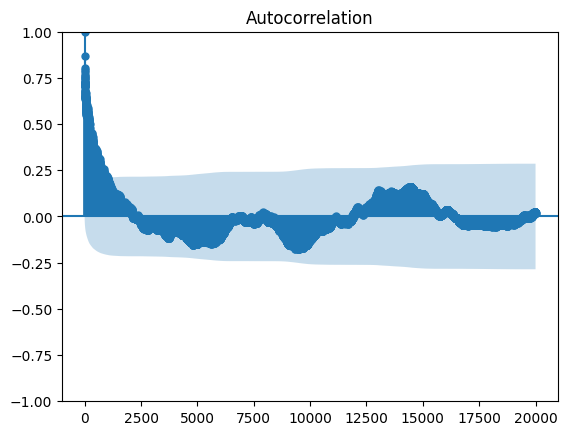

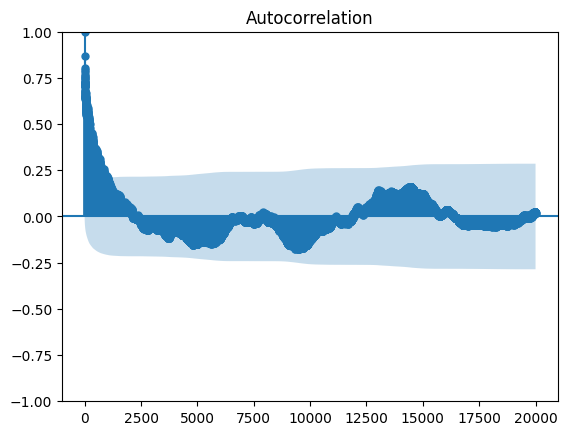

In [29]:
plot_acf(df[0], lags=20000)